In [ ]:
import ee
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import os
import geemap

ee.Authenticate()
ee.Initialize(project="ee-shahlankabir")

# 1. Correct ROI selection
sirajganj_roi = ee.FeatureCollection("FAO/GAUL/2015/level2") \
    .filter(ee.Filter.eq('ADM2_NAME', 'Sirajganj')) \
    .geometry() # Get the actual geometry

def mask_clouds(image):
    qa = image.select('QA60')
    cloud_bit_mask = 1 << 10
    cirrus_bit_mask = 1 << 11
    # Fixed the .And() syntax error
    mask = qa.bitwiseAnd(cloud_bit_mask).eq(0).And(qa.bitwiseAnd(cirrus_bit_mask).eq(0))
    return image.updateMask(mask).divide(10000)

# 2. Structure dates as a list of tuples for easier looping
date_pairs = [
    ('2017-02-01', '2017-02-28'),
    ('2026-02-01', '2026-05-14') # Set to current date to avoid empty collections
]

# 3. Processing Loop
for start_date, end_date in date_pairs:
    # We select only the bands we need to keep the file size as small as possible
    dataset = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
               .filterBounds(sirajganj_roi)
               .filterDate(start_date, end_date)
               .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20))
               .map(mask_clouds)
               .median()
               .select(['B8', 'B4']) 
               .clip(sirajganj_roi))

    filename = f"Sirajganj_{start_date[:7]}.tif"
    
    print(f"Attempting tiled download for {filename}...")
    
    # download_ee_image is more robust for large areas than ee_export_image
    geemap.download_ee_image(
        dataset, 
        filename=filename, 
        scale=10, 
        region=sirajganj_roi,
        crs='EPSG:4326' # Ensure a standard coordinate system
    )

Attempting tiled download for Sirajganj_2017-02.tif...


c:\Users\santo\miniconda3\envs\geo\Lib\site-packages\geemap\common.py:12536: FutureWarning: 'BaseImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  img = gd.download.BaseImage(image)


  0%|          |0/136 tiles [00:00<?]

c:\Users\santo\miniconda3\envs\geo\Lib\site-packages\geedim\image.py:254: RuntimeWarning: Couldn't find STAC entry for: 'None'.
  return STACClient().get(self.id)


Attempting tiled download for Sirajganj_2026-02.tif...


  0%|          |0/136 tiles [00:00<?]

In [5]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt

# Open the file
with rasterio.open('Sirajganj_2017-02.tif') as src:
    print(f"Bands: {src.count}")
    print(f"Width: {src.width}, Height: {src.height}")
    print(f"CRS: {src.crs}")
    
    # Read the first band as a NumPy array
    band1 = src.read(1)

Bands: 2
Width: 6441, Height: 8570
CRS: EPSG:4326


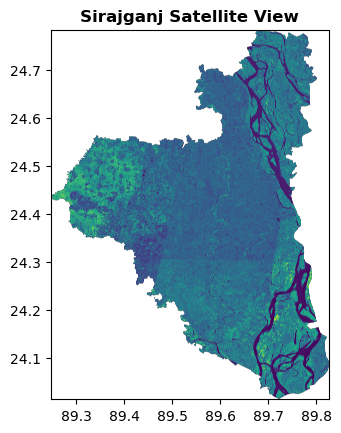

In [6]:
with rasterio.open('Sirajganj_2017-02.tif') as src:
    show(src, title="Sirajganj Satellite View", cmap='viridis')

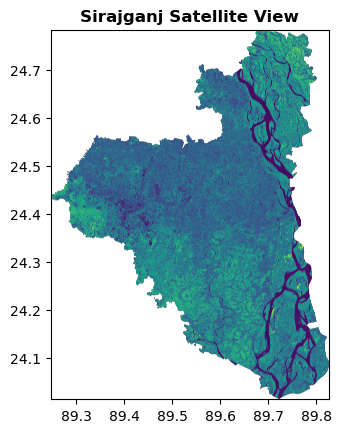

In [7]:
with rasterio.open('Sirajganj_2026-02.tif') as src:
    show(src, title="Sirajganj Satellite View", cmap='viridis')

Calculating NDVI for: Sirajganj_2017-02.tif


C:\Users\santo\AppData\Local\Temp\ipykernel_1772\3375667646.py:19: RuntimeWarning: invalid value encountered in subtract
  ndvi = (nir - red) / (nir + red + 1e-10)


Saved: NDVI_Sirajganj_2017-02.tif


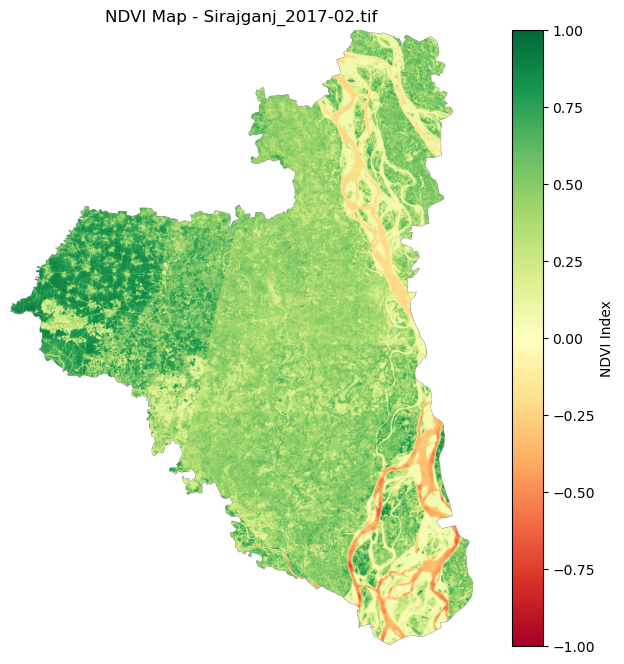

Calculating NDVI for: Sirajganj_2026-02.tif
Saved: NDVI_Sirajganj_2026-02.tif


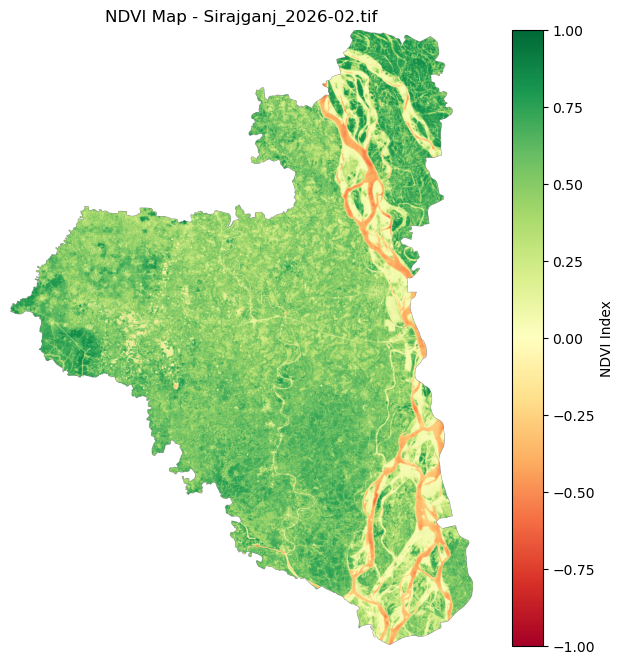

In [8]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import os

# 1. List all your downloaded .tif files
files = [f for f in os.listdir('.') if f.startswith('Sirajganj_') and f.endswith('.tif')]

for file in files:
    print(f"Calculating NDVI for: {file}")
    
    with rasterio.open(file) as src:
        # Based on our previous export: Band 1 = B8 (NIR), Band 2 = B4 (Red)
        nir = src.read(1).astype('float32')
        red = src.read(2).astype('float32')
        
        # 2. Perform NDVI Calculation
        # We add a tiny number (1e-10) to the denominator to prevent "Division by Zero" errors
        ndvi = (nir - red) / (nir + red + 1e-10)
        
        # 3. Create a Visualization
        plt.figure(figsize=(10, 8))
        plt.imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1) # Standard NDVI color ramp
        plt.colorbar(label='NDVI Index')
        plt.title(f'NDVI Map - {file}')
        plt.axis('off')
        
        # 4. Save the Result locally as a new TIF
        # Copy metadata from the original file
        output_meta = src.meta.copy()
        output_meta.update({
            "driver": "GTiff",
            "dtype": "float32",
            "count": 1 # We are saving only 1 band (NDVI)
        })
        
        output_filename = f"NDVI_{file}"
        with rasterio.open(output_filename, "w", **output_meta) as dest:
            dest.write(ndvi, 1)
        
        print(f"Saved: {output_filename}")
        plt.show()

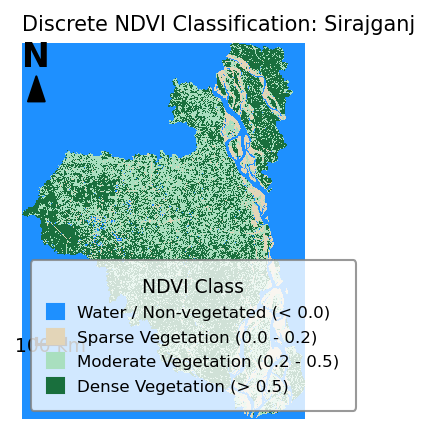

In [16]:
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np

# 1. Define high-quality colors and labels
# Water: Blue | Sparse: Tan | Moderate: Light Green | Dense: Dark Green
colors = ['#1e90ff', '#e3d5b8', '#a9dfbf', '#196f3d']
labels = [
    'Water / Non-vegetated (< 0.0)', 
    'Sparse Vegetation (0.0 - 0.2)', 
    'Moderate Vegetation (0.2 - 0.5)', 
    'Dense Vegetation (> 0.5)'
]

# Create the colormap
cmap_custom = ListedColormap(colors)

# 2. Setup the figure with high resolution (DPI)
fig, ax = plt.subplots(figsize=(4, 3), dpi=150)

# 3. Display the classified raster
# 'origin=upper' ensures the map isn't flipped
im = ax.imshow(ndvi_classified, cmap=cmap_custom, interpolation='nearest')

# 4. Create manual legend handles
# This creates the nice discrete squares in the legend
legend_handles = [
    mpatches.Patch(color=colors[i], label=labels[i]) 
    for i in range(len(labels))
]

# 5. Style the Legend
# Place it in the 'best' location or anchored outside
ax.legend(
    handles=legend_handles, 
    loc='lower left',           # Position
    fontsize='8',               # Smaller text
    title="NDVI Class",         # Simple title
    title_fontsize='9',         # Smaller title
    frameon=True, 
    framealpha=0.8,             # Semi-transparent background
    facecolor='white',
    edgecolor='gray',
    handlelength=1,             # Shorter color boxes
    handleheight=1,
    borderpad=1                 # Padding inside the legend box
)

# 6. Final Polish
ax.set_title(f'Discrete NDVI Classification: Sirajganj', fontsize=10, loc="left")
ax.axis('off')  # Hide pixel coordinates for a cleaner look


sx, sy = 0.05, 0.20
ax.plot([sx, sx+0.1], [sy, sy], transform=ax.transAxes, color='black', lw=1.5)
ax.plot([sx, sx], [sy, sy+0.015], transform=ax.transAxes, color='black', lw=1.5)
ax.plot([sx+0.1, sx+0.1], [sy, sy+0.015], transform=ax.transAxes, color='black', lw=1.5)
ax.text(sx+0.05, sy-0.02, "100 km", transform=ax.transAxes, ha='center', fontsize=9)

nx, ny = 0.05, 0.92
ax.text(nx, ny, 'N', transform=ax.transAxes, ha='center', va='bottom',
        fontsize=16, fontweight='bold')

ax.annotate(
    '',
    xy=(nx, ny-0.01),
    xytext=(nx, ny-0.06),
    arrowprops=dict(facecolor='black', width=1, headwidth=8),
    xycoords='axes fraction'
)



# Optional: Add a subtle grid or frame
plt.tight_layout()
plt.show()

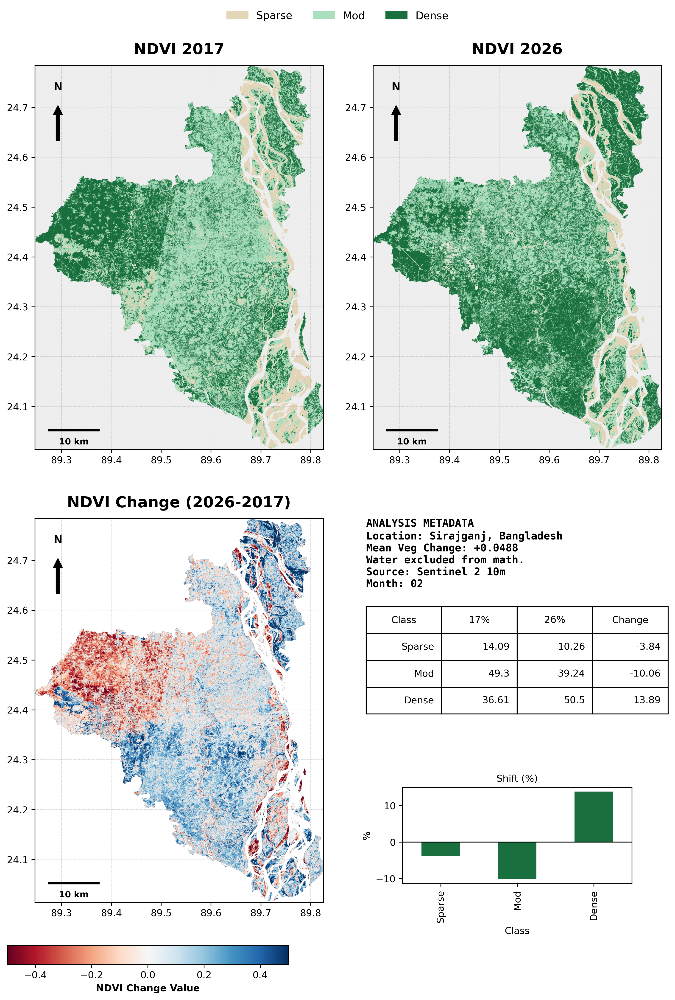

In [41]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import FancyArrowPatch
from matplotlib.colors import ListedColormap, TwoSlopeNorm
import numpy as np
import pandas as pd
import rasterio
from math import cos, radians

# =========================================================
# ASSUMED VARIABLES ALREADY EXIST
# ---------------------------------------------------------
# class_2017
# class_2026
# ndvi_diff
# extent
# df_stats
# =========================================================
with rasterio.open("NDVI_Sirajganj_2017-02.tif") as src17:
    data_17 = src17.read(1).astype('float32')
    extent = [src17.bounds.left, src17.bounds.right, src17.bounds.bottom, src17.bounds.top]
    
with rasterio.open("NDVI_Sirajganj_2026-02.tif") as src26:
    data_26 = src26.read(1).astype('float32')

min_rows, min_cols = min(data_17.shape[0], data_26.shape[0]), min(data_17.shape[1], data_26.shape[1])
ndvi_2017 = data_17[:min_rows, :min_cols]
ndvi_2026 = data_26[:min_rows, :min_cols]

# MASKING: Set Water/Non-veg (< 0) to NaN so they are "empty" for math
# This ensures they don't contribute to the Mean Change calculation
ndvi_2017[ndvi_2017 < 0] = np.nan
ndvi_2026[ndvi_2026 < 0] = np.nan

# Math now ignores NaNs automatically
ndvi_diff = ndvi_2026 - ndvi_2017

def classify_ndvi(arr):
    # Use 255 or 0 as a mask value for empty cells
    cl = np.zeros(arr.shape, dtype=np.float32)
    cl[np.isnan(arr)] = np.nan  # Keep empty cells empty
    cl[(arr >= 0) & (arr < 0.2)] = 1
    cl[(arr >= 0.2) & (arr < 0.5)] = 2
    cl[(arr >= 0.5)] = 3
    return cl

class_2017 = classify_ndvi(ndvi_2017)
class_2026 = classify_ndvi(ndvi_2026)

# --- 2. STATS (Ignoring NaNs) ---
def get_stats(cl_arr):
    # Only count pixels that are not NaN
    valid_pixels = cl_arr[~np.isnan(cl_arr)]
    unique, counts = np.unique(valid_pixels, return_counts=True)
    stats_map = {i: 0 for i in [1, 2, 3]} # Only veg classes
    for u, c in zip(unique, counts):
        stats_map[u] = (c / valid_pixels.size) * 100
    return stats_map

s17, s26 = get_stats(class_2017), get_stats(class_2026)
df_stats = pd.DataFrame({
    'Class': ['Sparse', 'Mod', 'Dense'],
    '17%': [s17[i] for i in [1, 2, 3]],
    '26%': [s26[i] for i in [1, 2, 3]]
})
df_stats['Change'] = df_stats['26%'] - df_stats['17%']

# =========================================================
# SCALE BAR
# =========================================================
def add_accurate_scale_bar(ax, extent, dist_km=10):

    lon_min, lon_max, lat_min, lat_max = extent

    avg_lat = (lat_min + lat_max) / 2

    km_per_degree = 111.32 * cos(radians(avg_lat))

    scale_width_deg = dist_km / km_per_degree

    x_start = lon_min + (lon_max - lon_min) * 0.05
    y_pos = lat_min + (lat_max - lat_min) * 0.05

    # Scale line
    ax.plot(
        [x_start, x_start + scale_width_deg],
        [y_pos, y_pos],
        color='black',
        lw=2.5,
        zorder=20
    )

    # Scale text
    ax.text(
        x_start + scale_width_deg / 2,
        y_pos - (lat_max - lat_min) * 0.02,
        f"{dist_km} km",
        ha='center',
        va='top',
        fontsize=9,
        fontweight='bold'
    )


# =========================================================
# NORTH ARROW
# =========================================================
def add_north_arrow(ax):

    arrow = FancyArrowPatch(
        (0.08, 0.80),     # start
        (0.08, 0.90),     # end
        transform=ax.transAxes,
        mutation_scale=18,
        color='black',
        arrowstyle='simple',
        zorder=20
    )

    ax.add_patch(arrow)

    ax.text(
        0.08,
        0.93,
        'N',
        transform=ax.transAxes,
        ha='center',
        va='bottom',
        fontsize=11,
        fontweight='bold',
        zorder=20
    )


# =========================================================
# FIGURE
# =========================================================
fig, axs = plt.subplots(
    2,
    2,
    figsize=(12, 15),
    dpi=300
)


# =========================================================
# COLORMAPS
# =========================================================
colors = ['#e3d5b8', '#a9dfbf', '#196f3d']

cmap_class = ListedColormap(colors)
cmap_class.set_bad(color='#eeeeee')


# =========================================================
# MAP STYLING FUNCTION
# =========================================================
def style_map(ax, title):

    ax.set_title(
        title,
        fontsize=16,
        fontweight='bold',
        pad=12
    )

    ax.grid(
        color='gray',
        linestyle='--',
        linewidth=0.5,
        alpha=0.3
    )

    # Important for equal map sizes
    ax.set_aspect('equal')

    add_accurate_scale_bar(ax, extent)
    add_north_arrow(ax)


# =========================================================
# MAP 1 : DENSITY 2017
# =========================================================
ax1 = axs[0, 0]

ax1.imshow(
    class_2017,
    cmap=cmap_class,
    extent=extent,
    vmin=1,
    vmax=3
)

style_map(ax1, "NDVI 2017")


# =========================================================
# MAP 2 : DENSITY 2026
# =========================================================
ax2 = axs[0, 1]

ax2.imshow(
    class_2026,
    cmap=cmap_class,
    extent=extent,
    vmin=1,
    vmax=3
)

style_map(ax2, "NDVI 2026")


# =========================================================
# MAP 3 : NDVI DIFFERENCE
# =========================================================
ax3 = axs[1, 0]

norm = TwoSlopeNorm(
    vmin=-0.5,
    vcenter=0,
    vmax=0.5
)

im_diff = ax3.imshow(
    ndvi_diff,
    cmap='RdBu',
    norm=norm,
    extent=extent
)

style_map(ax3, "NDVI Change (2026-2017)")


# =========================================================
# COLORBAR OUTSIDE MAP
# =========================================================
cax = fig.add_axes([0.10, 0.06, 0.34, 0.018])

cbar = fig.colorbar(
    im_diff,
    cax=cax,
    orientation='horizontal'
)

cbar.set_label(
    'NDVI Change Value',
    fontsize=10,
    fontweight='bold'
)


# =========================================================
# DATA PANEL
# =========================================================
ax_data = axs[1, 1]

ax_data.axis('off')

mean_ch = np.nanmean(ndvi_diff)

meta_txt = (
    f"ANALYSIS METADATA\n"
    f"Location: Sirajganj, Bangladesh\n"
    f"Mean Veg Change: {mean_ch:+.4f}\n"
    f"Water excluded from math. \n"
    f"Source: Sentinel 2 10m\n"
    f"Month: 02"
)

ax_data.text(
    0,
    1.0,
    meta_txt,
    transform=ax_data.transAxes,
    fontsize=11,
    fontweight='bold',
    family='monospace',
    va='top'
)


# =========================================================
# TABLE
# =========================================================
ax_table = ax_data.inset_axes([0, 0.42, 1, 0.42])

ax_table.axis('off')

tab = ax_table.table(
    cellText=df_stats.round(2).values,
    colLabels=df_stats.columns,
    loc='center'
)

tab.scale(1, 2.2)
tab.set_fontsize(10)


# =========================================================
# BAR CHART
# =========================================================
ax_bar = ax_data.inset_axes([0.12, 0.05, 0.76, 0.25])

df_stats.plot(
    x='Class',
    y='Change',
    kind='bar',
    ax=ax_bar,
    color='#196f3d',
    legend=False
)

ax_bar.axhline(
    0,
    color='black',
    lw=1
)

ax_bar.set_title(
    "Shift (%)",
    fontsize=10
)

ax_bar.set_ylabel('%')


# =========================================================
# GLOBAL LEGEND
# =========================================================
legend_handles = [
    mpatches.Patch(
        color=colors[i],
        label=df_stats['Class'][i]
    )
    for i in range(3)
]

fig.legend(
    handles=legend_handles,
    loc='upper center',
    ncol=3,
    bbox_to_anchor=(0.5, 0.992),
    frameon=False,
    fontsize=11
)


# =========================================================
# LAYOUT
# =========================================================
fig.subplots_adjust(
    top=0.93,
    bottom=0.12,
    wspace=0.12,
    hspace=0.18
)


# =========================================================
# SHOW
# =========================================================
plt.show()